In [1]:
import numpy as np
import pandas as pd
import seaborn as sns 
import plotly.express as px
import matplotlib.pyplot as plt
import geopandas
from folium import plugins

In [2]:
labeldf = pd.read_csv('/Users/sbp/Downloads/cluster_datav2.csv',index_col=0)


In [3]:
#ldf = labeldf.drop(columns=['Country', 'Data source','Gas','Unit','Emission','Year'])

In [4]:
# Reset index after drop
df = labeldf.dropna().reset_index(drop=True)

In [5]:
df.shape

(9656, 5)

In [6]:
df.head(20)

,Carbon,Methane,Nitrogen,FGas,Risk
0,517.75,4776.82,179.70,80.88,1.0
1,500.22,2651.58,169.34,63.24,1.0
2,414.50,2312.60,123.72,54.64,1.0
3,211.92,1056.19,55.59,21.74,1.0
4,202.14,986.20,55.52,21.65,1.0
5,165.92,869.41,55.04,18.35,1.0
6,135.27,826.90,45.10,16.78,1.0
7,118.56,644.11,44.48,15.61,1.0
8,86.56,585.71,30.95,12.51,1.0
9,81.96,572.46,27.98,12.07,1.0


### Labelled Data : Label defined here is Sector

In [7]:
df["Risk"].unique()


array([1., 0.])

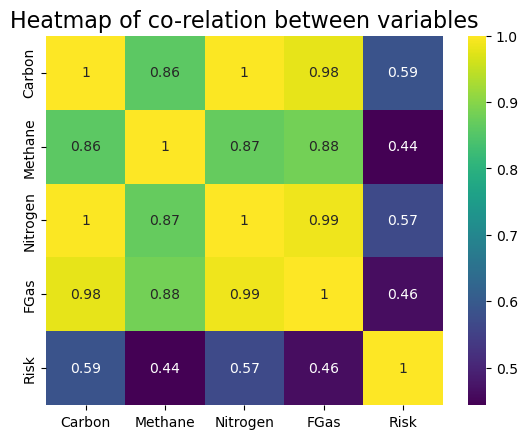

In [8]:
#Use heatmap to see corelation between variables
sns.heatmap(df.corr(),annot=True,cmap='viridis')
plt.title('Heatmap of co-relation between variables',fontsize=16)
plt.show()

In [9]:
# # The number of Risk in the dataset and its graphic.
# sns.countplot(x = "Risk", data = df)
# data.loc[:,"Risk"].value_counts()

In [10]:
# pd.crosstab(df.Carbon,df.Sector).plot(kind="bar",figsize=(20,6))
# plt.title('Heart Disease Frequency for Ages')
# plt.xlabel('Age')
# plt.ylabel('Frequency')
# plt.show()

### Featue Engineering and Testing the model

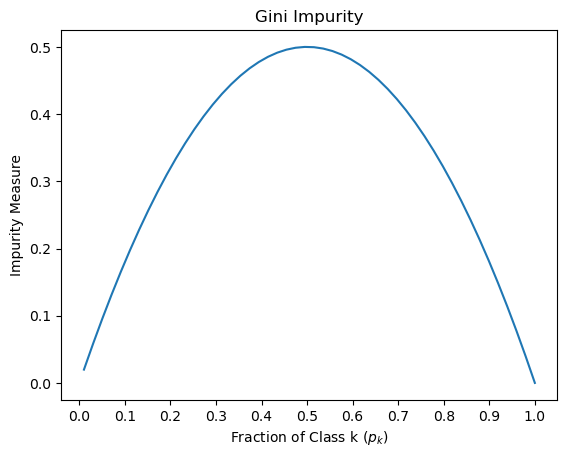

In [11]:
#A figure is created to show Gini ımpurity measures 
plt.figure()
x = np.linspace(0.01,1)
y = 1 - (x*x) - (1-x)*(1-x) 
plt.plot(x,y)
plt.title('Gini Impurity')
plt.xlabel("Fraction of Class k ($p_k$)")
plt.ylabel("Impurity Measure")
plt.xticks(np.arange(0,1.1,0.1))

plt.show()

### Naive Bayes

In [12]:
X = df.drop(['Risk'], axis=1)

y = df['Risk']

In [13]:
# split X and y into training and testing sets

from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 0)

In [14]:
# check the shape of X_train and X_test

X_train.shape, X_test.shape


((6759, 4), (2897, 4))

In [15]:
#X_test.isnull().sum()

In [16]:
cols = X_train.columns


In [17]:
from sklearn.preprocessing import RobustScaler

scaler = RobustScaler()

X_train = scaler.fit_transform(X_train)

X_test = scaler.transform(X_test)


In [18]:
X_train = pd.DataFrame(X_train, columns=[cols])
X_test = pd.DataFrame(X_test, columns=[cols])


In [19]:
X_train.head()


,Carbon,Methane,Nitrogen,FGas
0,0.00,0.132678,0.000000,0.0
1,0.00,-0.058968,0.000000,0.0
2,0.25,-0.049140,0.333333,0.0
3,19.75,-0.058968,10.833333,0.0
4,2.75,1.051597,2.000000,0.0


In [20]:
# train a Gaussian Naive Bayes classifier on the training set
from sklearn.naive_bayes import GaussianNB


# instantiate the model
gnb = GaussianNB()


# fit the model
gnb.fit(X_train, y_train)

/Users/sbp/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


GaussianNB()

In [21]:
y_pred = gnb.predict(X_test)

y_pred

/Users/sbp/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


array([0., 0., 0., ..., 0., 0., 0.])

In [22]:
from sklearn.metrics import accuracy_score

print('Model accuracy score: {0:0.4f}'. format(accuracy_score(y_test, y_pred)))

Model accuracy score: 0.9793


In [23]:
# print the scores on training and test set

print('Training set score: {:.4f}'.format(gnb.score(X_train, y_train)))

print('Test set score: {:.4f}'.format(gnb.score(X_test, y_test)))

Training set score: 0.9851
Test set score: 0.9793


/Users/sbp/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/Users/sbp/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


In [24]:
# Print the Confusion Matrix and slice it into four pieces

from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y_test, y_pred)

print('Confusion matrix\n\n', cm)

print('\nTrue Positives(TP) = ', cm[0,0])

print('\nTrue Negatives(TN) = ', cm[1,1])

print('\nFalse Positives(FP) = ', cm[0,1])

print('\nFalse Negatives(FN) = ', cm[1,0])

Confusion matrix

 [[2812   60]
 [   0   25]]

True Positives(TP) =  2812

True Negatives(TN) =  25

False Positives(FP) =  60

False Negatives(FN) =  0


<AxesSubplot:>

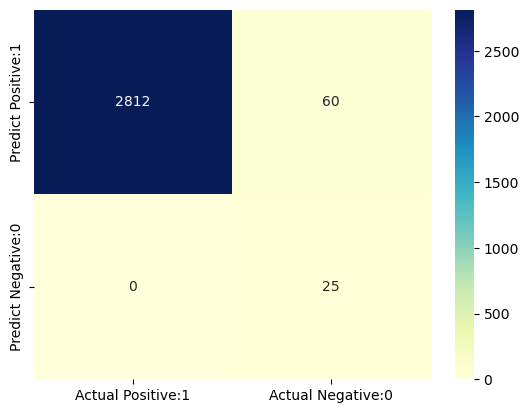

In [25]:
# visualize confusion matrix with seaborn heatmap

cm_matrix = pd.DataFrame(data=cm, columns=['Actual Positive:1', 'Actual Negative:0'], 
                                 index=['Predict Positive:1', 'Predict Negative:0'])

sns.heatmap(cm_matrix, annot=True, fmt='d', cmap='YlGnBu')

In [26]:
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

def print_score(clf, X_train, y_train, X_test, y_test, train=True):
    if train:
        pred = clf.predict(X_train)
        clf_report = pd.DataFrame(classification_report(y_train, pred, output_dict=True))
        print("Train Result:\n================================================")
        print(f"Accuracy Score: {accuracy_score(y_train, pred) * 100:.2f}%")
        print("_______________________________________________")
        print(f"CLASSIFICATION REPORT:\n{clf_report}")
        print("_______________________________________________")
        print(f"Confusion Matrix: \n {confusion_matrix(y_train, pred)}\n")
        
    elif train==False:
        pred = clf.predict(X_test)
        clf_report = pd.DataFrame(classification_report(y_test, pred, output_dict=True))
        print("Test Result:\n================================================")        
        print(f"Accuracy Score: {accuracy_score(y_test, pred) * 100:.2f}%")
        print("_______________________________________________")
        print(f"CLASSIFICATION REPORT:\n{clf_report}")
        print("_______________________________________________")
        print(f"Confusion Matrix: \n {confusion_matrix(y_test, pred)}\n")

In [27]:
from sklearn.tree import DecisionTreeClassifier

tree_clf = DecisionTreeClassifier(random_state=42)
tree_clf.fit(X_train, y_train)

print_score(tree_clf, X_train, y_train, X_test, y_test, train=True)
print_score(tree_clf, X_train, y_train, X_test, y_test, train=False)

Train Result:
Accuracy Score: 100.00%
_______________________________________________
CLASSIFICATION REPORT:
              0.0   1.0  accuracy  macro avg  weighted avg
precision     1.0   1.0       1.0        1.0           1.0
recall        1.0   1.0       1.0        1.0           1.0
f1-score      1.0   1.0       1.0        1.0           1.0
support    6702.0  57.0       1.0     6759.0        6759.0
_______________________________________________
Confusion Matrix: 
 [[6702    0]
 [   0   57]]

Test Result:
Accuracy Score: 100.00%
_______________________________________________
CLASSIFICATION REPORT:
              0.0   1.0  accuracy  macro avg  weighted avg
precision     1.0   1.0       1.0        1.0           1.0
recall        1.0   1.0       1.0        1.0           1.0
f1-score      1.0   1.0       1.0        1.0           1.0
support    2872.0  25.0       1.0     2897.0        2897.0
_______________________________________________
Confusion Matrix: 
 [[2872    0]
 [   0   25]]



/Users/sbp/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/Users/sbp/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/Users/sbp/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


In [30]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import GridSearchCV

params = {
    "criterion":("gini", "entropy"), 
    "splitter":("best", "random"), 
    "max_depth":(list(range(1, 20))), 
    "min_samples_split":[2, 3, 4], 
    "min_samples_leaf":list(range(1, 20)), 
}


tree_clf = DecisionTreeClassifier(random_state=42)
tree_cv = GridSearchCV(
    tree_clf, 
    params, 
    scoring="f1", 
    n_jobs=-1, 
    verbose=1, 
    cv=5
)

tree_cv.fit(X_train, y_train)
best_params = tree_cv.best_params_
print(f"Best paramters: {best_params})")

tree_clf = DecisionTreeClassifier(**best_params)
tree_clf.fit(X_train, y_train)
print_score(tree_clf, X_train, y_train, X_test, y_test, train=True)
print_score(tree_clf, X_train, y_train, X_test, y_test, train=False)


Fitting 5 folds for each of 4332 candidates, totalling 21660 fits


/Users/sbp/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/Users/sbp/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/Users/sbp/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/Users/sbp/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/Users/s

Best paramters: {'criterion': 'gini', 'max_depth': 1, 'min_samples_leaf': 1, 'min_samples_split': 2, 'splitter': 'best'})
Train Result:
Accuracy Score: 100.00%
_______________________________________________
CLASSIFICATION REPORT:
              0.0   1.0  accuracy  macro avg  weighted avg
precision     1.0   1.0       1.0        1.0           1.0
recall        1.0   1.0       1.0        1.0           1.0
f1-score      1.0   1.0       1.0        1.0           1.0
support    6702.0  57.0       1.0     6759.0        6759.0
_______________________________________________
Confusion Matrix: 
 [[6702    0]
 [   0   57]]

Test Result:
Accuracy Score: 100.00%
_______________________________________________
CLASSIFICATION REPORT:
              0.0   1.0  accuracy  macro avg  weighted avg
precision     1.0   1.0       1.0        1.0           1.0
recall        1.0   1.0       1.0        1.0           1.0
f1-score      1.0   1.0       1.0        1.0           1.0
support    2872.0  25.0       1.0 

/Users/sbp/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/Users/sbp/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/Users/sbp/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/Users/sbp/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/Users/s

In [65]:
X_train

,Carbon,Methane,Nitrogen,FGas
0,0.000,0.132678,0.000000,0.0
1,0.000,-0.058968,0.000000,0.0
2,0.250,-0.049140,0.333333,0.0
3,19.750,-0.058968,10.833333,0.0
4,2.750,1.051597,2.000000,0.0
...,...,...,...,...
6754,0.000,-0.058968,0.000000,0.0
6755,0.125,-0.058968,0.000000,0.0
6756,0.000,6.422604,0.000000,0.0
6757,0.000,0.378378,0.000000,0.0


In [68]:
from IPython.display import Image as PImage
from subprocess import check_call
from PIL import Image, ImageDraw, ImageFont

In [78]:
import graphviz

In [79]:
import os
os.environ["PATH"] += os.pathsep + '/Users/sbp/opt/anaconda3/lib/python3.9/site-packages/graphviz'

In [81]:
# Export our trained model as a .dot file
#with open("tree1.dot", 'w') as f:
f = tree.export_graphviz(tree_clf,
                      out_file=None,
                      max_depth = 3,
                      impurity = True,
                      feature_names = list(X_train.columns),
                      class_names = ["high risk", "low risk"],
                      rounded = True,
                      filled= True )
        
i = 1
graph = graphviz.Source(f) 
## Create dynamic graph name
tempname=str("Graph" + str(i))
graph.render(tempname)

ExecutableNotFound: failed to execute PosixPath('dot'), make sure the Graphviz executables are on your systems' PATH